#  **SCC0270 - Redes Neurais e Aprendizado Profundo**

## **Trabalho 1**

* Dataset: MedPix 2.0 with DR-Minerva and Knowledge Graph
* Multimodalidade: texto e imagem
* Problema: classificação multi-classe

* Arxiv: https://arxiv.org/html/2407.02994v1#S3
* Github: https://github.com/CHILab1/MedPix-2.0

## Introdução 

O objetivo do Trabalho 01 é construir um algoritmo de classificação binária para classificar as imagens da base MedPix-2.0, de acordo com as duas labels disponíveis `CP` e `MRI`. 

Usaremos as métricas apresentadas pelos autores no artigo no ArXiv como fator comparativo para nossos modelos nesta primeira tarefa de classificação de modalidade. 

De início, utilizaremos descritores de imagens e texturas para extrair as características da imagem para construir os algoritmos de classificação.


## Resultados dos Autores

Conforme documentado no artigo, para a tareda de classificação da Modalidade da Imagem, os autores obtiveram os seguintes valores de acurácias, com os seguintes modelos:

* RN50x16 and CLIP encoder: `58% accuracy` 
* BioBERT: `88% accuracy`

---

In [2]:
# Bibliotecas
import pandas as pd
import matplotlib.pyplot as plt

import warnings; warnings.filterwarnings("ignore")
import requests
import json
from PIL import Image
from io import BytesIO
import os
import cv2
import mahotas as mt 
from skimage import io  
import numpy as np

In [3]:
# # Importar o MyDrive
# drive.mount('/content/drive')

## 0.0 - Informações sobre os dados 

Localmente, os dados estão presentes na pasta `MedPix-2.0`. Os dados com o split, estão na pasta `MedPix-2.0/splitted_dataset`.

Os dados foram divididos em dois tipos de Documentos JSON:

1. `Description Document`: dados com informações referentes apenas as imagens. 
2. `Case-Topic Document`: dados com informações relacionadas ao caso clínico. 

Existe uma relação do tipo **uma-para-muitos** entre um dado do tipo Descrition e outro do tipo Case-Topic.

O arquivo `uid_list.json` apresenta os UIds que foram utilizados na divisão das bases `Case_topic.json` e `Descriptions.json` nas bases de `train`, `train_1`, `train_2`, `dev` e `test`.

Portanto, utilizaremos as divisões realizadas pelos autores para o treinamento dos algoritmos.

## 0.1 Importando as descrições

In [4]:
def get_descriptions(url:str):

    # Importanto as descrições
    response = requests.get(url)
    # Separando por linha
    descricoes = response.text.splitlines() 
    return descricoes

In [5]:
GITHUB_URL = "https://raw.githubusercontent.com/CHILab1/MedPix-2.0/refs/heads/main/MedPix-2-0/splitted_dataset/descriptions_dev.jsonl"

In [6]:
# Exemplo: descrição da posição 0
get_descriptions(GITHUB_URL)[0]

'{"Type":"CT","U_id":"MPX1009","image":"MPX1009_synpic46283","Description":{"ACR Codes":"8.-1","Age":"73","Caption":"The prostate is enlarged with several calcifications  noted within.  No dominant prostate mass is evident.","Figure Part":null,"Modality":"CT - noncontrast","Plane":"Coronal","Sex":"male"},"Location":"Genitourinary","Location Category":"Reproductive and Urinary System"}'

In [7]:
def create_content_df(url:str):

    descricoes = get_descriptions(url)

    # Estruturando as informções em uma tabela
    dados = []
    for linha in descricoes:
        registro = json.loads(linha)
        descricao = registro.pop("Description")
        registro.update(descricao)
        dados.append(registro)

    # Criando o DataFrame
    df = pd.DataFrame(dados) 

    return df

In [8]:
# Visualizando as 5 primeiras linhas
df = create_content_df(GITHUB_URL)
df.head()

,Type,U_id,image,Location,Location Category,ACR Codes,Age,Caption,Figure Part,Modality,Plane,Sex
0,CT,MPX1009,MPX1009_synpic46283,Genitourinary,Reproductive and Urinary System,8.-1,73,The prostate is enlarged with several calcific...,None,CT - noncontrast,Coronal,male
1,CT,MPX1009,MPX1009_synpic46295,Genitourinary,Reproductive and Urinary System,8.-1,73,Bladder is prominent with mildly thickened wal...,None,CT - noncontrast,Axial,male
2,CT,MPX1075,MPX1075_synpic20513,"Chest, Pulmonary",Thorax,6.3,66,"1.6 x 1.8cm right middle lobe nodule, adjacent...",None,CT w/contrast (IV),Axial,female
3,CT,MPX1109,MPX1109_synpic28526,Gastrointestinal,Abdomen,7.0,33,Coronal reconstruction of the axial non-contra...,None,CT - noncontrast,Coronal,female
4,CT,MPX1135,MPX1135_synpic16704,Endocrine,Abdomen,8.3,30,Large soft tissue mass arising from left adren...,None,CT w/contrast (IV),Axial,male


## 0.2 Importando a imagem de um caso como exemplo

In [9]:
# Obtendo o nome da imagem associada ao caso 0
i = 0 # index da tabela
image_name = df['image'][0]

image_name

'MPX1009_synpic46283'

In [10]:
# Plotando a imagem a partir do DRIVE (não rodar em ambiente local)

# Caminho para a imagem no drive
# try:
#     image_path = r'/content/drive/MyDrive/[Trabalho] SCC0270 - Redes Neurais e Aprendizado Profundo/images/'+ image_name +'.png'
#     img = Image.open(image_path)
# except Exception:
#     #caminho local 
#     image_path = f"./images/{image_name}.png" 
#     img = Image.open(image_path)

# # Mostrando a imagem
# plt.imshow(img)
# plt.axis('off')  # tira os eixos
# plt.show()

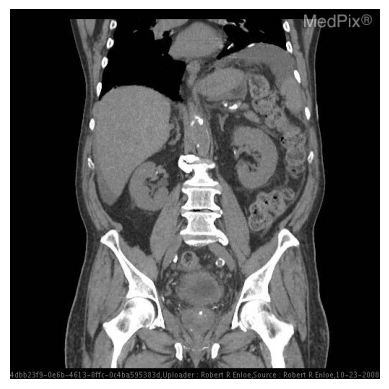

In [11]:
# Plotando a imagem a partir do GITHUB

def plot_image(image_name:str):
    # URL (raw) da imagem no GitHub
    url = 'https://raw.githubusercontent.com/CHILab1/MedPix-2.0/refs/heads/main/MedPix-2-0/images/'+ image_name +'.png'

    # Importando a imagem
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))

    # Mostrando a imagem
    plt.imshow(img)
    plt.axis('off')  # tira os eixos
    plt.show() 

plot_image(image_name="MPX1009_synpic46283")

Exemplo de imagem de MR

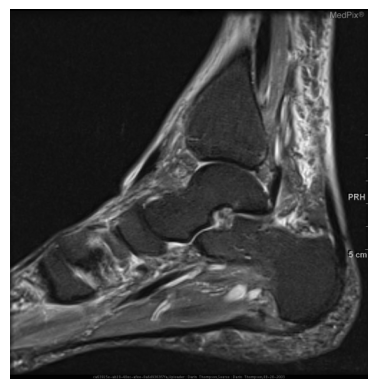

In [12]:
plot_image("MPX2586_synpic17310")

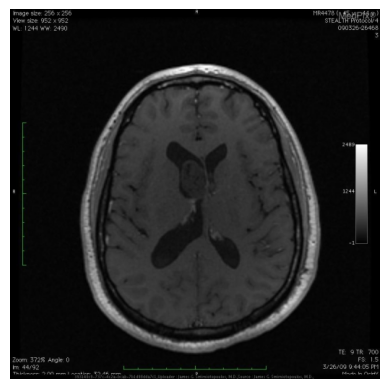

In [13]:
plot_image("MPX2607_synpic52590")

## Distribuicao das Imagens

Os autores mesmo buscaram construir o conjunto de dados de modo que ele fosse o mais balanceado possível entre as classes.

In [14]:
df.Type.value_counts(normalize=True)

Type
MR    0.573604
CT    0.426396
Name: proportion, dtype: float64

# **1 Desenvolvimento**

Como o objetivo do trabalho 01 é construir um classificador binário, usaremos apenas os dados do Documento Descriptions, referente às imagens. 

Usaremos os conjuntos de dados `train_1` e `train_2` para o treinamento, o conjunto `dev` para validação e o conjunto `test` para teste das predições.

Existem 1643 imagens no conjunto de treino sendo: 

* 810 imagens em `train_1`
* 843 imagens em `train_2`

## Organização das Imagens de Treino

In [15]:
DESCRIPTIONS_TRAIN_PATH = "./MedPix-2.0/splitted_dataset/descriptions_train.jsonl"

In [16]:
def read_data(path:str) -> pd.DataFrame:
    
    with open(path, "r+") as f:
        lines = f.readlines()
    
        dados = []
        for linha in lines:
            registro = json.loads(linha)
            descricao = registro.pop("Description")
            registro.update(descricao)
            dados.append(registro)

    # Criando o DataFrame
    df = pd.DataFrame(dados) 

    return df

In [17]:
df_train = read_data(DESCRIPTIONS_TRAIN_PATH)

In [18]:
df_train.head()

,Type,U_id,image,Location,Location Category,ACR Codes,Age,Caption,Figure Part,Modality,Plane,Sex
0,CT,MPX1024,MPX1024_synpic40275,"Chest, Pulmonary",Thorax,-1.-1,60,CT of the chest reveals an obstructing mass an...,None,CT - noncontrast,Axial,female
1,CT,MPX1024,MPX1024_synpic40277,"Chest, Pulmonary",Thorax,-1.-1,60,CT of the chest reveals an obstructing mass an...,None,CT - noncontrast,Axial,female
2,CT,MPX1012,MPX1012_synpic22949,Genitourinary,Reproductive and Urinary System,8.2,14,pelvis,None,CT - GI & IV Contrast,Axial,female
3,CT,MPX1012,MPX1012_synpic22950,Genitourinary,Reproductive and Urinary System,8.2,14,pelvis,None,CT - GI & IV Contrast,Axial,female
4,CT,MPX1016,MPX1016_synpic34317,"Chest, Pulmonary",Thorax,6.3,43,Contrast enhanced chest CT shows diffuse incre...,2a,CT w/contrast (IV),Axial,female


In [19]:
train_images = []

train_img_path = read_data(DESCRIPTIONS_TRAIN_PATH)['image'] 

for img_name in train_img_path:
    img_name = "./MedPix-2.0/images/" + img_name + ".png"
    train_images.append(img_name)

## Gerando o dataset com as imagens

In [20]:
train_img_list = []

for image in train_images:
    try:
        image_id = image.split("/")[3].split(".")[0]
        img_type = df_train.query("image == @image_id")["Type"].item()
        img_location = df_train.query("image == @image_id")["Location"].item()
        image_data = io.imread(image) 
        image_data = cv2.cvtColor(image_data, cv2.COLOR_BGR2RGB) 

        train_img_dict = {
            "Image_ID": image_id,
            "Class": img_type,
            "Location" : img_location,
            "Image": image_data
        }

        train_img_list.append(train_img_dict)

    except Exception as e:
        print("Warning:", image)
        print(e)


Visualizando as 30 primeiras imagens do dataset de treino.

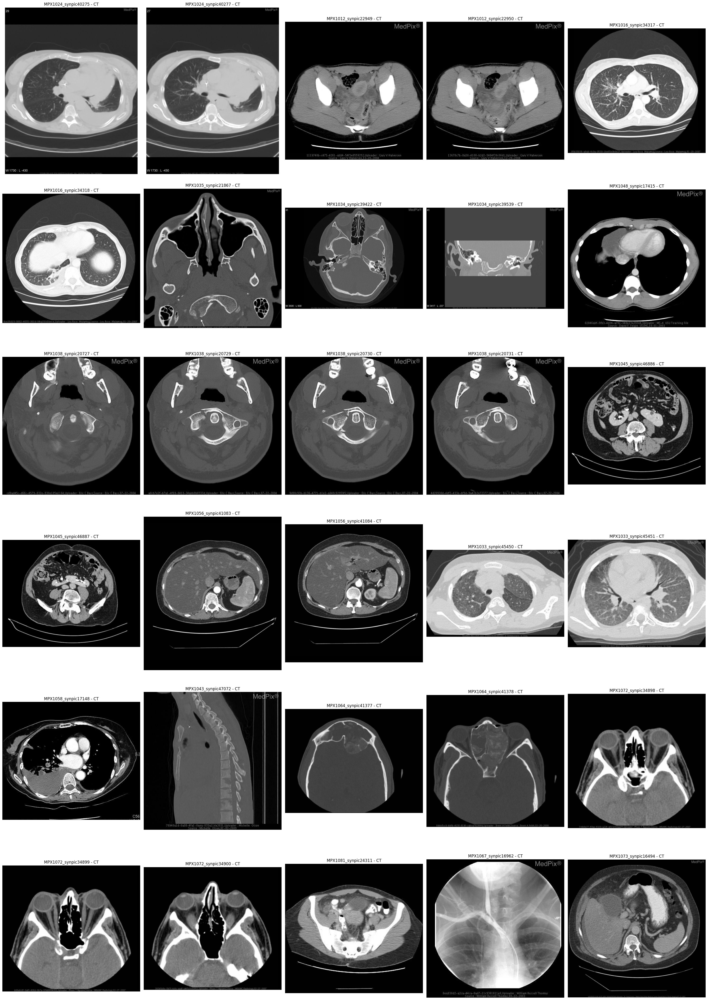

In [21]:
plt.figure(figsize=(30, 50)) 
columns = 5

for i, img_dict in enumerate(train_img_list[:30]):
    plt.subplot(int(len(train_img_list[:30]) / columns + 1), columns, i + 1)
    plt.imshow(cv2.cvtColor(img_dict["Image"], cv2.COLOR_RGB2BGR))
    plt.title(f'{img_dict["Image_ID"]} - {img_dict["Class"]}', fontsize=12)
    plt.axis("off")

plt.tight_layout()
plt.show()

## Extraindo Descritores de Textura via Textura de Haralick

In [22]:
def extract_features(image):
        # calculate haralick texture features for 4 types of adjacency
        textures = mt.features.haralick(image)
        ht_mean = textures.mean(axis=0)
        return ht_mean

Visualizando texturas para uma Imagem

Altura 643
Largura 512
Canais 3


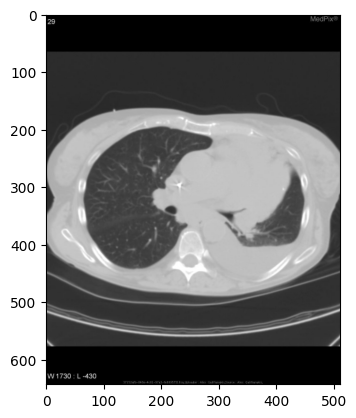

In [23]:
image = io.imread(train_images[0])

print("Altura", image.shape[0])
print("Largura", image.shape[1])
print("Canais", image.shape[2])

plt.imshow(cv2.cvtColor(image, cv2.COLOR_RGB2BGR))
plt.show()

In [24]:
extract_features(image)

array([ 4.37744555e-02,  7.97788698e+01,  9.92812739e-01,  5.55016388e+03,
        6.70390503e-01,  1.77260081e+02,  2.21208767e+04,  6.52634919e+00,
        8.06095397e+00,  1.44216346e-03,  2.39959770e+00, -6.17052634e-01,
        9.99448352e-01])

### Caracteristicas das Texturas de Haralick

A função `extract_features` calcula 13 features com base nas texturas de Haralick, são elas:


1. **Momento Angular Segundo (ASM)**
Mede a uniformidade local dos níveis de cinza. Quando os pixels são muito semelhantes, o valor do ASM será grande.

2. **Contraste**
É uma medida da variação de intensidade ou dos níveis de cinza entre o pixel de referência e seus vizinhos. Um grande contraste reflete grandes diferenças de intensidade na matriz de coocorrência (GLCM).

3. **Correlação**
Mostra a dependência linear entre os valores de níveis de cinza na matriz de coocorrência.

4. **Soma dos quadrados: variância**
Atribui pesos relativamente altos aos elementos que diferem do valor médio da matriz. Mede a variância, associada à heterogeneidade.

5. M**omento de Diferença Inversa (IDM)**
Mede a homogeneidade local. Valores mais altos indicam menor variação local nos níveis de cinza.

6. **Média da Soma**
Mede a soma da média de todos os níveis de cinza.

7. **Variância da Soma**
Mede a heterogeneidade e está fortemente correlacionada com variáveis estatísticas de primeira ordem, como o desvio padrão. Aumenta quando os valores dos níveis de cinza se afastam da média.

8. **Entropia da Soma**
Mede a não-uniformidade ou a complexidade da textura na imagem.

9. **Entropia**
Mede a desordem de uma imagem e atinge seu valor máximo quando todos os elementos da matriz de probabilidade (P) são iguais.

10. **Variância da Diferença**
Definida como a variância de p(x−y), de maneira similar à variância da soma. Mede a variabilidade nas diferenças entre pares de pixels.

11. **Entropia da Diferença**
Mede a aleatoriedade ou falta de estrutura/ordem no contraste da imagem.

12. **Medida de Informação de Correlação 1**
Mede a correlação baseada em medidas de informação mútua entre variáveis, utilizando diferentes abordagens estatísticas.

13. **Medida de Informação de Correlação 2**
Uma segunda abordagem para medir correlação com base em informação mútua entre os níveis de cinza.

## Extraindo Descritores de Textura

In [25]:
from tqdm.notebook import tqdm 

X = [] 
y_true = [] 
counter = 0 
for image in tqdm(train_img_list):
    textures = extract_features(image["Image"])
    y_true.append(image["Class"])
    X.append(textures)
    counter += 1

  0%|          | 0/1653 [00:00<?, ?it/s]

In [26]:
X_textura = np.array(X)

### Mapping para a Modalidade

In [27]:
label_map = {"CT":1, "MR":0}
label_reverse_map = {1:"CT", 0:"MR"}
y_true_encoded = [label_map[class_] for class_ in y_true]

## Classificando Usando Texturas

In [28]:
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split 

X_train, X_test, y_train, y_test = train_test_split(X_textura, y_true_encoded, test_size=0.2, random_state=42) 
scaler = StandardScaler() 
X_train = scaler.fit_transform(X_train) 

neigh = KNeighborsClassifier(n_neighbors=3, metric="cosine") 
neigh.fit(X_train, y_train)

KNeighborsClassifier(metric='cosine', n_neighbors=3)

### Predição Conjunto de Validação 

In [29]:
X_test = scaler.transform(X_test) 
y_pred = neigh.predict(X_test) 

# y_pred

## Métricas de Avaliação

In [30]:
from sklearn.metrics import classification_report 

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.89      0.91      0.90       144
           1       0.93      0.91      0.92       187

    accuracy                           0.91       331
   macro avg       0.91      0.91      0.91       331
weighted avg       0.91      0.91      0.91       331



### Conjunto de Teste dos Autores

In [31]:
DESCRIPTIONS_TEST_PATH = "./MedPix-2.0/splitted_dataset/descriptions_test.jsonl"

df_test_data = read_data(DESCRIPTIONS_TEST_PATH) 

test_images = []

test_img_path = df_test_data['image'] 

for img_name in test_img_path:
    img_name = "./MedPix-2.0/images/" + img_name + ".png"
    test_images.append(img_name)

In [32]:
test_img_list = []

for image in test_images:
    try:
        image_id = image.split("/")[3].split(".")[0]
        img_type = df_test_data.query("image == @image_id")["Type"].item()
        image_data = io.imread(image) 
        image_data = cv2.cvtColor(image_data, cv2.COLOR_BGR2RGB) 

        test_img_dict = {
            "Image_ID": image_id,
            "Class": img_type,
            "Image": image_data
        }

        test_img_list.append(test_img_dict)

    except Exception as e:
        print("Warning:", image)
        print(e)

Visualizando as 30 primeiras imagens do dataset de test

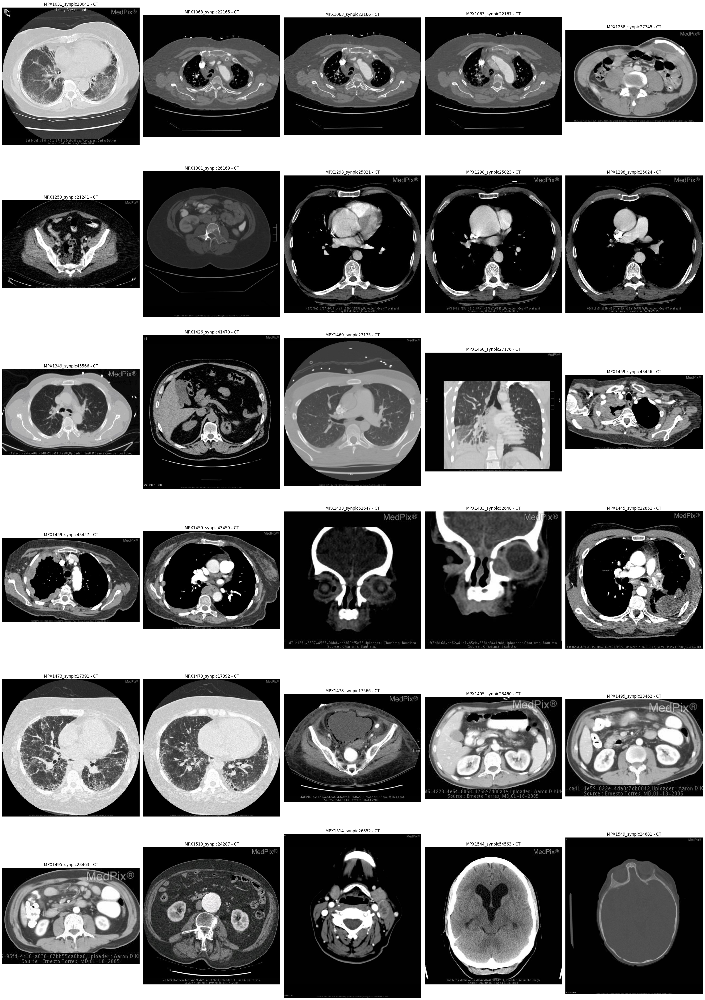

In [33]:
plt.figure(figsize=(30, 50)) 
columns = 5

for i, img_dict in enumerate(test_img_list[:30]):
    plt.subplot(int(len(test_img_list[:30]) / columns + 1), columns, i + 1)
    plt.imshow(cv2.cvtColor(img_dict["Image"], cv2.COLOR_RGB2BGR))
    plt.title(f'{img_dict["Image_ID"]} - {img_dict["Class"]}', fontsize=12)
    plt.axis("off")

plt.tight_layout()
plt.show()

### Extraindo Descritores de Textura do Conjunto de Teste dos Autores

In [34]:
from tqdm.notebook import tqdm 

X_test = [] 
y_test_true = [] 
counter = 0 
for image in tqdm(test_img_list):
    textures = extract_features(image["Image"])
    y_test_true.append(image["Class"])
    X_test.append(textures)
    counter += 1

  0%|          | 0/200 [00:00<?, ?it/s]

In [35]:
X_test_textura = np.array(X_test)
y_test_true_encoded = [label_map[class_] for class_ in y_test_true]

### Métricas de Avaliação

In [36]:
X_test = scaler.transform(X_test_textura) 
y_pred_test = neigh.predict(X_test_textura)

In [37]:
print(classification_report(y_test_true_encoded, y_pred_test))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       100
           1       0.50      1.00      0.67       100

    accuracy                           0.50       200
   macro avg       0.25      0.50      0.33       200
weighted avg       0.25      0.50      0.33       200



Vemos que no conjunto de dados de test, separado pelos autores, a acurácia do modelo cai bastante. Vai para 50%.

## Classificando a Localização da Imagem

In [38]:
df_train.head()

,Type,U_id,image,Location,Location Category,ACR Codes,Age,Caption,Figure Part,Modality,Plane,Sex
0,CT,MPX1024,MPX1024_synpic40275,"Chest, Pulmonary",Thorax,-1.-1,60,CT of the chest reveals an obstructing mass an...,None,CT - noncontrast,Axial,female
1,CT,MPX1024,MPX1024_synpic40277,"Chest, Pulmonary",Thorax,-1.-1,60,CT of the chest reveals an obstructing mass an...,None,CT - noncontrast,Axial,female
2,CT,MPX1012,MPX1012_synpic22949,Genitourinary,Reproductive and Urinary System,8.2,14,pelvis,None,CT - GI & IV Contrast,Axial,female
3,CT,MPX1012,MPX1012_synpic22950,Genitourinary,Reproductive and Urinary System,8.2,14,pelvis,None,CT - GI & IV Contrast,Axial,female
4,CT,MPX1016,MPX1016_synpic34317,"Chest, Pulmonary",Thorax,6.3,43,Contrast enhanced chest CT shows diffuse incre...,2a,CT w/contrast (IV),Axial,female


Existem 14 Localidades disntintas no conjunto de treino. 


### Encoder para Location

In [39]:
from sklearn.preprocessing import LabelEncoder

y_true_location = []

for image in tqdm(train_img_list):
    # textures = extract_features(image["Image"])
    y_true_location.append(image["Location"])
    # X.append(textures)
    counter += 1

  0%|          | 0/1653 [00:00<?, ?it/s]

In [40]:
le = LabelEncoder() 
y_true_location_encoded = le.fit_transform(y_true_location)

### Divisão dos Dados em treino e teste e fit

In [41]:
X_train_location, X_test_location, y_train_location, y_test_location = train_test_split(X_textura, y_true_location_encoded, test_size=0.2, random_state=42) 
scaler = StandardScaler() 
X_train_location = scaler.fit_transform(X_train_location) 

neigh_location = KNeighborsClassifier(n_neighbors=5, metric="euclidean") 
neigh_location.fit(X_train_location, y_train_location)

KNeighborsClassifier(metric='euclidean')

In [42]:
X_test_location = scaler.transform(X_test_location) 
y_pred_location = neigh.predict(X_test_location)

In [43]:
print(classification_report(y_test_location, y_pred_location))

              precision    recall  f1-score   support

           0       0.01      0.11      0.01         9
           1       0.00      0.00      0.00         0
           2       0.00      0.00      0.00        86
           3       0.00      0.00      0.00         2
           4       0.00      0.00      0.00         9
           5       0.00      0.00      0.00        45
           7       0.00      0.00      0.00         2
           8       0.00      0.00      0.00        15
           9       0.00      0.00      0.00        39
          10       0.00      0.00      0.00        11
          11       0.00      0.00      0.00        18
          12       0.00      0.00      0.00        14
          13       0.00      0.00      0.00         1
          14       0.00      0.00      0.00        43
          15       0.00      0.00      0.00        11
          17       0.00      0.00      0.00         2
          18       0.00      0.00      0.00         2
          19       0.00    

Descritores de textura não são suficientes para a extração de informações necessárias para a classificação da Localização das Imagens.

### Extraindo Descritores de Imagens (Histograma)

In [44]:
def extract_colors(images:list):
    color = ('b','g','r')
    dataset_hist_r = []
    dataset_hist_g = []
    dataset_hist_b = []

    for image in tqdm(images):

        for i,col in enumerate(color):
            histr = cv2.calcHist([image["Image"]],[i],None,[4],[0,256])
            if col == 'r': dataset_hist_r.append(histr)
            if col == 'g': dataset_hist_g.append(histr)
            if col == 'b': dataset_hist_b.append(histr)

        X_r = np.array(dataset_hist_r)
        X_g = np.array(dataset_hist_g)
        X_b = np.array(dataset_hist_b)

        X_cores = np.concatenate((X_r,X_g,X_b),axis=1)
        
    print("Dimension:", X_cores.shape) 
    return X_cores

In [45]:
X_cores = extract_colors(train_img_list)
X_cores_train = X_cores.reshape(X_cores.shape[0], 12)

  0%|          | 0/1653 [00:00<?, ?it/s]

Dimension: (1653, 12, 1)


## Classificação usando Cores 

In [59]:
X_train_cores, X_test_cores, y_train, y_test = train_test_split(X_cores_train, y_true_encoded, test_size=0.20, random_state=42)

scaler = StandardScaler()
scaler.fit(X_train_cores)
X_train = scaler.transform(X_train_cores)


neigh = KNeighborsClassifier(n_neighbors=4,metric="cosine")
neigh.fit(X_train_cores, y_train)

KNeighborsClassifier(metric='cosine', n_neighbors=4)

### Predizendo a Classe usando descritores de cores

In [60]:
X_test_cores = scaler.transform(X_test_cores) 
y_pred = neigh.predict(X_test_cores) 

In [61]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.62      0.74      0.68       144
           1       0.77      0.65      0.71       187

    accuracy                           0.69       331
   macro avg       0.69      0.70      0.69       331
weighted avg       0.70      0.69      0.69       331



### Usando o conjunto de dados de teste dos autores

In [62]:
X_cores_test = extract_colors(test_img_list) 
X_cores_test_set = X_cores_test.reshape(X_cores_test.shape[0], 12)

  0%|          | 0/200 [00:00<?, ?it/s]

Dimension: (200, 12, 1)


In [63]:
X_cores_test_set = scaler.transform(X_cores_test_set) 
y_pred = neigh.predict(X_cores_test_set) 

In [64]:
print(classification_report(y_test_true_encoded, y_pred))

              precision    recall  f1-score   support

           0       0.60      0.64      0.62       100
           1       0.62      0.58      0.60       100

    accuracy                           0.61       200
   macro avg       0.61      0.61      0.61       200
weighted avg       0.61      0.61      0.61       200



## Unindo Descritores de Textura e Cores

Vamos unir ambos os descritores para ver se obtemos uma melhor acurácia nos algortimos de classificação.

In [65]:
X_train_cores_texturas = np.concatenate((X_textura,X_cores_train),axis=1)
X_train_cores_texturas.shape

(1653, 25)

In [66]:
X_train_cores_texturas, X_test_cores_textura, y_train, y_test = train_test_split(X_train_cores_texturas, y_true_encoded, test_size=0.20, random_state=42)

scaler = StandardScaler()
scaler.fit(X_train_cores_texturas)
X_train = scaler.transform(X_train_cores_texturas)


neigh = KNeighborsClassifier(n_neighbors=5,metric="cosine")
neigh.fit(X_train_cores_texturas, y_train)

KNeighborsClassifier(metric='cosine')

In [67]:
X_test_cores_textura = scaler.transform(X_test_cores_textura) 
y_pred_cores_textura = neigh.predict(X_test_cores_textura) 

In [68]:
print(classification_report(y_test, y_pred_cores_textura))

              precision    recall  f1-score   support

           0       0.61      0.61      0.61       144
           1       0.70      0.70      0.70       187

    accuracy                           0.66       331
   macro avg       0.66      0.66      0.66       331
weighted avg       0.66      0.66      0.66       331



### Usando o conjunto de teste usado pelos autores

In [69]:
X_cores_textura_test_set = np.concatenate((X_test_textura, X_cores_test_set), axis=1) 
X_cores_textura_test_set.shape

(200, 25)

In [70]:
X_cores_textura_test_set = scaler.transform(X_cores_textura_test_set) 
y_pred_cores_textura_test_set = neigh.predict(X_cores_textura_test_set) 

In [71]:
print(classification_report(y_test_true_encoded, y_pred_cores_textura_test_set))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       100
           1       0.50      1.00      0.67       100

    accuracy                           0.50       200
   macro avg       0.25      0.50      0.33       200
weighted avg       0.25      0.50      0.33       200



Usando cores e texturas vemos que o algoritmo KNN não é capaz de classificar com precisão superior a um chute aleatório, a qual modalidade a imagem representa.

Configurações 

## Data Loader

In [78]:

# Define transforms
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])


# Paths
train_json = './MedPix-2.0/splitted_dataset/descriptions_train.jsonl'
test_json = './MedPix-2.0/splitted_dataset/descriptions_test.jsonl'
images_dir = './MedPix-2.0/images'

# Datasets and Dataloaders
train_dataset = MedicalImageDataset(train_json, images_dir, transform=transform)
val_dataset = MedicalImageDataset(test_json, images_dir, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=4)

# Load pre-trained ResNet50
model = models.resnet50(pretrained=True)

# Freeze all layers
for param in model.parameters():
    param.requires_grad = False

# Unfreeze the last 3 layers
# These layers are: layer4[0], layer4[1], and the final FC layer
for name, param in model.named_parameters():
    if 'layer4.0' in name or 'layer4.1' in name or 'fc' in name:
        param.requires_grad = True

# Replace the final fully connected layer
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 2)

model = model.to(device)

# Define loss and optimizer (only for the unfrozen parameters)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-4)

# Training loop
def train_model(model, criterion, optimizer, num_epochs=10):
    for epoch in range(num_epochs):
        print(f'Epoch {epoch+1}/{num_epochs}')
        
        model.train()
        running_loss = 0.0
        correct = 0
        
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            optimizer.zero_grad()
            
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            correct += torch.sum(preds == labels.data)

        epoch_loss = running_loss / len(train_dataset)
        epoch_acc = correct.double() / len(train_dataset)
        
        print(f'Train Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')
        
        # Validation
        model.eval()
        val_correct = 0
        
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                val_correct += torch.sum(preds == labels.data)
        
        val_acc = val_correct.double() / len(val_dataset)
        print(f'Val Acc: {val_acc:.4f}')
        
    return model

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to C:\Users\heito/.cache\torch\hub\checkpoints\resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:04<00:00, 25.5MB/s]


In [ ]:
model = train_model(model, criterion, optimizer, num_epochs=100)

Epoch 1/100
